#### Import Relevant Libraries

In [0]:

import re 

from pyspark.sql.functions import col, explode, size, lower, split, monotonically_increasing_id
import random
import os
from functools import reduce

%pip install sentence-transformers
from sentence_transformers import SentenceTransformer

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import seaborn as sns

Note: you may need to restart the kernel using %restart_python or dbutils.library.restartPython() to use updated packages.


2025-03-28 23:06:45.015925: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-28 23:06:45.097687: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-28 23:06:45.445964: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-28 23:06:49.575150: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


#### Load jobs database we used in our NER Model

In [0]:
def upload_data(file_location):
    # File location and type
    file_type = "csv"

    # CSV options
    infer_schema = "false"
    first_row_is_header = "true"
    delimiter = ","
    quote_char = '"'

    # The applied options are for CSV files. For other file types, these will be ignored.
    df = spark.read.format(file_type) \
    .option("inferSchema", infer_schema) \
    .option("header", first_row_is_header) \
    .option("sep", delimiter) \
    .option("multiline", "true") \
    .option("quote", quote_char) \
    .option("maxCharsPerColumn", 1000000) \
    .option("escape", '"') \
    .load(file_location)

    return df

def preprocess_data(job_skills_df, job_description_df_list):

    combined_df = reduce(lambda df1, df2: df1.union(df2), job_description_df_list)

    df_joined = combined_df.join(job_skills_df, on="job_link", how="left")
    df_joined = df_joined.withColumn("job_skills", lower(col("job_skills"))).withColumn("job_summary", lower(col("job_summary")))


    return df_joined

In [0]:
job_skill_file_location = "/FileStore/tables/job_skills.csv"
job_summary_file_locations = [f"/FileStore/tables/job_description(bbr)/job_summary_part{i}.csv" for i in range(1, 4)]
job_skill_df = upload_data(job_skill_file_location)
job_summary_list = [upload_data(file_location) for file_location in job_summary_file_locations]

jobs_df = preprocess_data(job_skill_df, job_summary_list)
jobs_df = jobs_df.withColumn("skills_list", split(col("job_skills"), ", "))
jobs_df = jobs_df.filter((col("skills_list").isNotNull()) | (size(col("skills_list")) > 0))

In [0]:
jobs_df.count()

1294374

In [0]:
jobs_df.display()

job_link job_summary job_skills skills_list https://au.linkedin.com/jobs/view/2x-senior-ccu-icu-rns-%245000-bonus-regional-nsw-at-curis-recruitment-3797851296 $5000 bonus available now!! don't miss this fantastic opportunity to work in outback nsw on a 12-week contract.
are you an experienced senior ccu/icu registered nurse looking for an adventure? we have a fantastic contract opportunity in outback nsw with a 12 week contract starting asap. join this amazing health service making a difference in regional nsw!
job details
$5000 bonus!!!
12 week contract
up to $57.23 per hour (based on experience) + 11% superannuation
free travel provided from within australia
fully paid for accommodation provided
start asap
the location
you will be living in an area with a population of approximately 19,000 people. the area is known for its thriving arts community, mining heritage and access to many outback adventures. the area also offers fantastic galleries, cafe's and a lot more, with plenty to do and explore in your time off. the town has an airport with daily flights to sydney, dubbo, adelaide, griffith and mildura making it easily accessible to get in and out easily.
to be eligible for this position, you must have the following:
current ahpra registration with no restrictions
senior rn experience in ccu/icu essential
must be ventilator and als competent
to apply for this great opportunity, please email an up-to-date copy of your cv to ellie@curis.com.au and we will be in contact within 24 hours.
why work with curis recruitment?
we have a proven record of placing nurses into fantastic positions across australia with some of the best hospitals and health centres.
our clients know that we only represent the best nurses out there so when you are represented by us you are always shown in the best light and this gives you a foot in the door right at that first step.
not the right role for you but know someone who would be amazing??? refer them to us and if we place them you are eligible for a $300 gift voucher of your choice! make sure they mention your name when they apply. feel free to check out our other vacancies at www.curisrecruitment.com.au
don’t miss your opportunity to earn an extra $5k!
show more
show less senior ccu/icu registered nurse, current ahpra registration with no restrictions, senior rn experience in ccu/icu, ventilator and als competent, australiabased List(senior ccu/icu registered nurse, current ahpra registration with no restrictions, senior rn experience in ccu/icu, ventilator and als competent, australiabased) https://au.linkedin.com/jobs/view/accident-management-specialist-at-imok-accident-replacement-cars-3791776244 company description
imok accident replacement cars provides like-for-like hire cars, claims management and repairs management services to not-at-fault accident drivers australia wide.
role description
this is a full-time on-site role for an accident management specialist located in sydney, nsw at imok accident replacement cars. the primary responsibility of the accident management specialist is to arrange hire cars, assess eligibility, investigate and determine the at-fault party, manage insurance claims, and manage repairs for the clients. the role also includes negotiating with insurance companies, working with lawyers and handling claim payments.
qualification and experience
some working knowledge of motor insurance policies and the auto industry i
n generalexper
ience as a motor insurance case manager is desirable but not essentialexcel
lent analytical and problem-solving skillsstron
g verbal and written communication skillsexcel
lent negotiation and customer service skillsabili
ty to work independently and in a team environment to meet deadlinesprofi
cient in microsoft office, including excel, word, and outlook, as well as claims processing software
show more
show less motor insurance policies, auto industry, motor insurance case manager, analytical, problemsolving, verbal communication, written co

In [0]:
jobs_df.printSchema()

root
 |-- job_link: string (nullable = true)
 |-- job_summary: string (nullable = true)
 |-- job_skills: string (nullable = true)
 |-- skills_list: array (nullable = true)
 |    |-- element: string (containsNull = false)



In [0]:
# Add a new column with the number of sentences (split by ".")
jobs_df_with_sentence_count = jobs_df.withColumn(
    "sentence_count",
    size(split(col("job_summary"), r"\."))
)


jobs_df_with_sentence_count.display()

job_link job_summary job_skills skills_list sentence_count https://au.linkedin.com/jobs/view/2x-senior-ccu-icu-rns-%245000-bonus-regional-nsw-at-curis-recruitment-3797851296 $5000 bonus available now!! don't miss this fantastic opportunity to work in outback nsw on a 12-week contract.
are you an experienced senior ccu/icu registered nurse looking for an adventure? we have a fantastic contract opportunity in outback nsw with a 12 week contract starting asap. join this amazing health service making a difference in regional nsw!
job details
$5000 bonus!!!
12 week contract
up to $57.23 per hour (based on experience) + 11% superannuation
free travel provided from within australia
fully paid for accommodation provided
start asap
the location
you will be living in an area with a population of approximately 19,000 people. the area is known for its thriving arts community, mining heritage and access to many outback adventures. the area also offers fantastic galleries, cafe's and a lot more, with plenty to do and explore in your time off. the town has an airport with daily flights to sydney, dubbo, adelaide, griffith and mildura making it easily accessible to get in and out easily.
to be eligible for this position, you must have the following:
current ahpra registration with no restrictions
senior rn experience in ccu/icu essential
must be ventilator and als competent
to apply for this great opportunity, please email an up-to-date copy of your cv to ellie@curis.com.au and we will be in contact within 24 hours.
why work with curis recruitment?
we have a proven record of placing nurses into fantastic positions across australia with some of the best hospitals and health centres.
our clients know that we only represent the best nurses out there so when you are represented by us you are always shown in the best light and this gives you a foot in the door right at that first step.
not the right role for you but know someone who would be amazing??? refer them to us and if we place them you are eligible for a $300 gift voucher of your choice! make sure they mention your name when they apply. feel free to check out our other vacancies at www.curisrecruitment.com.au
don’t miss your opportunity to earn an extra $5k!
show more
show less senior ccu/icu registered nurse, current ahpra registration with no restrictions, senior rn experience in ccu/icu, ventilator and als competent, australiabased List(senior ccu/icu registered nurse, current ahpra registration with no restrictions, senior rn experience in ccu/icu, ventilator and als competent, australiabased) 17 https://au.linkedin.com/jobs/view/accident-management-specialist-at-imok-accident-replacement-cars-3791776244 company description
imok accident replacement cars provides like-for-like hire cars, claims management and repairs management services to not-at-fault accident drivers australia wide.
role description
this is a full-time on-site role for an accident management specialist located in sydney, nsw at imok accident replacement cars. the primary responsibility of the accident management specialist is to arrange hire cars, assess eligibility, investigate and determine the at-fault party, manage insurance claims, and manage repairs for the clients. the role also includes negotiating with insurance companies, working with lawyers and handling claim payments.
qualification and experience
some working knowledge of motor insurance policies and the auto industry i
n generalexper
ience as a motor insurance case manager is desirable but not essentialexcel
lent analytical and problem-solving skillsstron
g verbal and written communication skillsexcel
lent negotiation and customer service skillsabili
ty to work independently and in a team environment to meet deadlinesprofi
cient in microsoft office, including excel, word, and outlook, as well as claims processing software
show more
show less motor insurance policies, auto industry, motor insurance case manager, analytical, problemsolving, verbal communi

In [0]:
sentence_counts = jobs_df_with_sentence_count.select("sentence_count").rdd.flatMap(lambda x: x).collect()

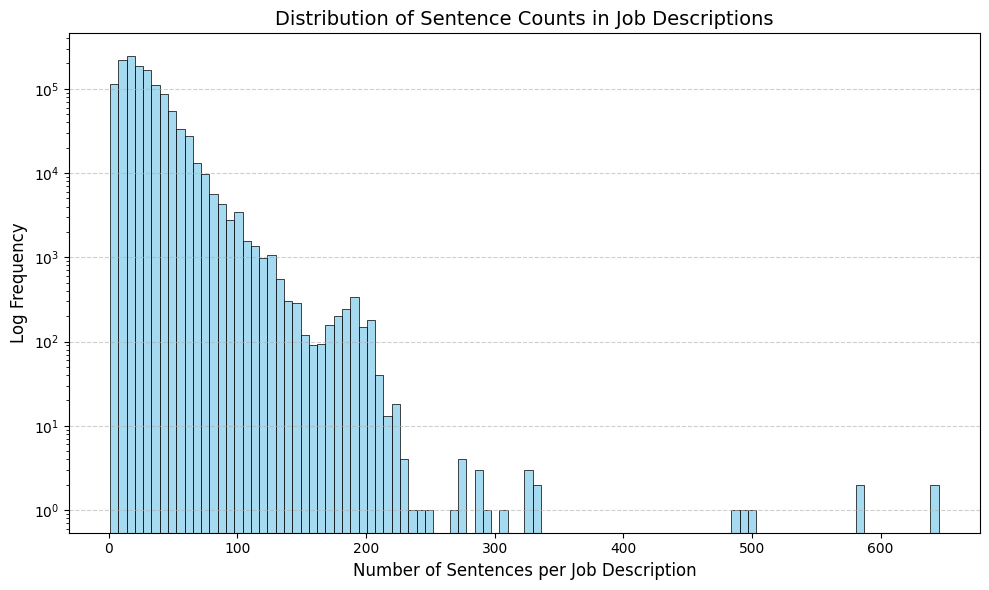

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Plot histogram with log scale and better binning
plt.figure(figsize=(10, 6))
sns.histplot(sentence_counts, bins=100, kde=False, color='skyblue', edgecolor='black', log_scale=(False, True))

plt.title("Distribution of Sentence Counts in Job Descriptions", fontsize=14)
plt.xlabel("Number of Sentences per Job Description", fontsize=12)
plt.ylabel("Log Frequency", fontsize=12)
plt.grid(True, axis='y', linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

sample beacause the whole dataset is too big

In [0]:
sample_10000_list = jobs_df_with_sentence_count.rdd.takeSample(False, 10000, seed=42)
sample_10000_df = spark.createDataFrame(sample_10000_list, schema=jobs_df_with_sentence_count.schema)

Embedding the jobs' descriptions 

In [0]:
model = SentenceTransformer('all-MiniLM-L6-v2')

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

/databricks/python/lib/python3.11/site-packages/huggingface_hub/file_download.py:795: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [0]:
from pyspark.sql.functions import udf
from pyspark.sql.types import ArrayType, FloatType

# Define a UDF to apply the model encoding
@udf(ArrayType(FloatType()))
def encode_udf(text):
    return model.encode(text).tolist()

# Apply the UDF to the DataFrame
sample_10000_embedding = sample_10000_df.withColumn(
    "description_embedding",
    encode_udf(col("job_summary"))
)

display(sample_10000_embedding)

job_link job_summary job_skills skills_list sentence_count description_embedding https://www.linkedin.com/jobs/view/manager-in-training-full-time-at-hibbett-3761779125 00284 mobile, al
le_301 hibbett retail, inc.
job title:
manager in training
department:
operations
flsa status:
non-exempt
reports to:
store manager
summary
the manager in training is responsible for assisting the store manager regarding overall operations and administrative duties. the manager in training is knowledgeable in each product area or department in our store. assists in determining the methods and approaches necessary to accomplish the store’s goals and initiatives. upholds policies, procedures and standards listed in the visual manual. they must fully promote each sale and/or promotion. serves as an ambassador of hibbett i city gear creating a unique customer experience helping to acquire and retain long-time customers. the manager in training is passionate about giving outstanding customer service and promoting the merchandise in stores. the manager in training assumes supervisory control in the store manager’s absence and is trained in the store manager’s responsibilities.
essential duties and responsibilities
assist the store manager in controlling the assets of hibbett i city gear
consults with store manager in establishing action plan to accomplish departmental and overall store responsibilities such as selling, restocking, merchandising, ordering, and scheduling.
assumes responsibility of the entire store in the absence of the store manager.
provides knowledge and guidance to employees and customers in all departments when necessary.
is aware of inventory, sales statistics, and expenses to ensure profitability in all departments.
direct staff to ensure each department’s responsibilities and standards are completed.
keeps the store manager informed about inventory movement and customer trends.
assures quality customer service is maintained.
performs general administrative duties as needed and is trained in the store manager’s responsibilities.
produce and give extraordinary customer service highlighted in the customer service manual, including helping customers as they enter the store, and helping multiple customers during peak periods.
promote and sell services and merchandise provided by hibbett i city gear.
practice and uphold all hibbett i city gear policies, procedures, and standards as listed in the operations policy manual, personnel policy manual, visual manual, customer service manual, and memos with the company’s direction.
protect the company’s assets and financial information by ensuring the accuracy and effectiveness of internal control procedures and informing management and/or appropriate officials of potential fraud risk.
supervisory responsibilities
supervises employees in the absence of the store manager. carries out supervisory responsibilities in accordance with the organization's policies and applicable laws. responsibilities include interviewing, and training employees; planning, assigning, and directing work; and resolving problems.
qualifications
experience working in a retail environment, preferably in footwear and athletic apparel.
1-3 years of customer service experience.
excellent interpersonal and communication skills.
ability to work in a fast-paced environment.
ability to assist in managing a team and keep up with overall goals and profits.
is a self-starter, has initiative to take on important tasks without being asked.
strong attention to detail with the ability to handle multiple tasks simultaneously and with precision.
is a team-player, passionate about outstanding customer service and selling merchandise.
hibbett's privacy policy
candidates will have an option during the application process to withdraw their application prior to completion of the application. throughout this online job application process, you will be asked to provide personal information about yourself. please review hibbett’s privacy policy

In [0]:
embedding_10000_list = sample_10000_embedding.select("description_embedding").rdd.flatMap(lambda x: x).collect()

In [0]:
embeddings_10000_np = np.array(embedding_10000_list)

cluster the descriptions using K-means , and PCA to reduce dimensionality for plotting

In [0]:
# Apply KMeans clustering
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(embeddings_10000_np)

# Reduce dimensions for visualization
pca = PCA(n_components=2)
reduced = pca.fit_transform(embeddings_10000_np)

/databricks/python/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f5950682e80>
Traceback (most recent call last):
  File "/databricks/python/lib/python3.11/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/databricks/python/lib/python3.11/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/databricks/python/lib/python3.11/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self

Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run puzzled-gull-12 at: https://adb-3738544368441327.7.azuredatabricks.net/ml/experiments/3614314504000210/runs/227401f450c843f29586eb405e1cf296
🧪 View experiment at: https://adb-3738544368441327.7.azuredatabricks.net/ml/experiments/3614314504000210


Uploading artifacts:   0%|          | 0/9 [00:00<?, ?it/s]

🏃 View run whimsical-cub-343 at: https://adb-3738544368441327.7.azuredatabricks.net/ml/experiments/3614314504000210/runs/7e4ee0fb9eec4093a4b259bb54a8832d
🧪 View experiment at: https://adb-3738544368441327.7.azuredatabricks.net/ml/experiments/3614314504000210


add the cluster column to the DataFrame

In [0]:
from pyspark.sql import Row

# Convert clusters to list
clusters_list = clusters.tolist()

# Zip the DataFrame rows with clusters
zipped_rdd = sample_10000_embedding.rdd.zipWithIndex().map(lambda x: Row(**x[0].asDict(), cluster=clusters_list[x[1]]))

# Convert back to DataFrame
sample_10000_clusters = spark.createDataFrame(zipped_rdd)

In [0]:
sample_10000_clusters.display()

com.databricks.backend.common.rpc.CommandCancelledException
	at com.databricks.spark.chauffeur.ExecContextState.cancel(ExecContextState.scala:445)
	at com.databricks.spark.chauffeur.ExecutionContextManagerV1.cancelExecution(ExecutionContextManagerV1.scala:464)
	at com.databricks.spark.chauffeur.ChauffeurState.$anonfun$process$1(ChauffeurState.scala:571)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperation$1(UsageLogging.scala:528)
	at com.databricks.logging.UsageLogging.executeThunkAndCaptureResultTags$1(UsageLogging.scala:633)
	at com.databricks.logging.UsageLogging.$anonfun$recordOperationWithResultTags$4(UsageLogging.scala:656)
	at com.databricks.logging.AttributionContextTracing.$anonfun$withAttributionContext$1(AttributionContextTracing.scala:48)
	at com.databricks.logging.AttributionContext$.$anonfun$withValue$1(AttributionContext.scala:276)
	at scala.util.DynamicVariable.withValue(DynamicVariable.scala:62)
	at com.databricks.logging.AttributionContext$.withValue(Attr

Clusters Size

In [0]:
sample_cluster_group_by = sample_10000_clusters.groupBy("cluster").count().orderBy("cluster")
sample_cluster_group_by.display()

cluster,count
0,3075
1,3033
2,1839
3,2053


Average number of sentence for cluster

In [0]:
sample_cluster_group_by_avg_sentences = sample_10000_clusters.groupBy("cluster").avg("sentence_count").orderBy("cluster")
sample_cluster_group_by_avg_sentences.display()

cluster,avg(sentence_count)
0,27.954796747967478
1,25.951862842070557
2,26.2620989668298
3,26.452021432050657


Top frequent skills for cluster

In [0]:
from pyspark.sql.functions import explode, col

exploded = sample_10000_clusters.select("cluster", explode("skills_list").alias("skill"))

# Count top skills per cluster
top_skills_per_cluster = exploded.groupBy("cluster", "skill") \
                                 .count() \
                                 .orderBy("cluster", "count", ascending=[True, False])


In [0]:
top_skills_per_cluster.filter(col("cluster") == 0).display()

cluster,skill,count
0,communication,865
0,project management,710
0,communication skills,533
0,problem solving,461
0,teamwork,451
0,leadership,437
0,attention to detail,367
0,time management,328
0,customer service,322
0,data analysis,318


In [0]:
top_skills_per_cluster.filter(col("cluster") == 1).display()

cluster,skill,count
1,patient care,793
1,nursing,655
1,communication,654
1,teamwork,458
1,leadership,298
1,communication skills,291
1,critical thinking,265
1,registered nurse,245
1,documentation,239
1,collaboration,237


In [0]:
top_skills_per_cluster.filter(col("cluster") == 2).display()

cluster,skill,count
2,customer service,1206
2,communication,851
2,teamwork,538
2,leadership,480
2,inventory management,382
2,communication skills,372
2,sales,356
2,problem solving,347
2,attention to detail,311
2,problemsolving,310


In [0]:
top_skills_per_cluster.filter(col("cluster") == 3).display()

cluster,skill,count
3,communication,546
3,customer service,426
3,communication skills,318
3,teamwork,310
3,attention to detail,224
3,time management,222
3,leadership,210
3,problemsolving,191
3,problem solving,187
3,microsoft office suite,175


Summary clusters' profiles

In [0]:
cluster_summaries = [
    {
        "Cluster": 0,
        "Category": "Project & Engineering Management",
        "Top Skills": "communication, project management, leadership, problem solving, budgeting, engineering",
        "Common Job Types": "Project Manager, Engineer, Operations Manager, Analyst, Business Developer"
    },
    {
        "Cluster": 1,
        "Category": "Healthcare & Nursing",
        "Top Skills": "patient care, nursing, CPR, healthcare, BLS, medical terminology",
        "Common Job Types": "Registered Nurse, Healthcare Assistant, Medical Technician, Case Manager"
    },
    {
        "Cluster": 2,
        "Category": "Retail & Store Operations",
        "Top Skills": "customer service, sales, merchandising, inventory, retail, food safety",
        "Common Job Types": "Retail Associate, Store Manager, Sales Representative, Cashier, Team Lead"
    },
    {
        "Cluster": 3,
        "Category": "Administrative & Education Support",
        "Top Skills": "communication, customer service, project management, microsoft office, teaching",
        "Common Job Types": "Admin Assistant, Program Coordinator, Teaching Assistant, Case Manager, Trainer"
    }
]

cluster_summary_df = pd.DataFrame(cluster_summaries)

In [0]:
cluster_summary_df.display()

Cluster,Category,Top Skills,Common Job Types
0,Project & Engineering Management,"communication, project management, leadership, problem solving, budgeting, engineering","Project Manager, Engineer, Operations Manager, Analyst, Business Developer"
1,Healthcare & Nursing,"patient care, nursing, CPR, healthcare, BLS, medical terminology","Registered Nurse, Healthcare Assistant, Medical Technician, Case Manager"
2,Retail & Store Operations,"customer service, sales, merchandising, inventory, retail, food safety","Retail Associate, Store Manager, Sales Representative, Cashier, Team Lead"
3,Administrative & Education Support,"communication, customer service, project management, microsoft office, teaching","Admin Assistant, Program Coordinator, Teaching Assistant, Case Manager, Trainer"


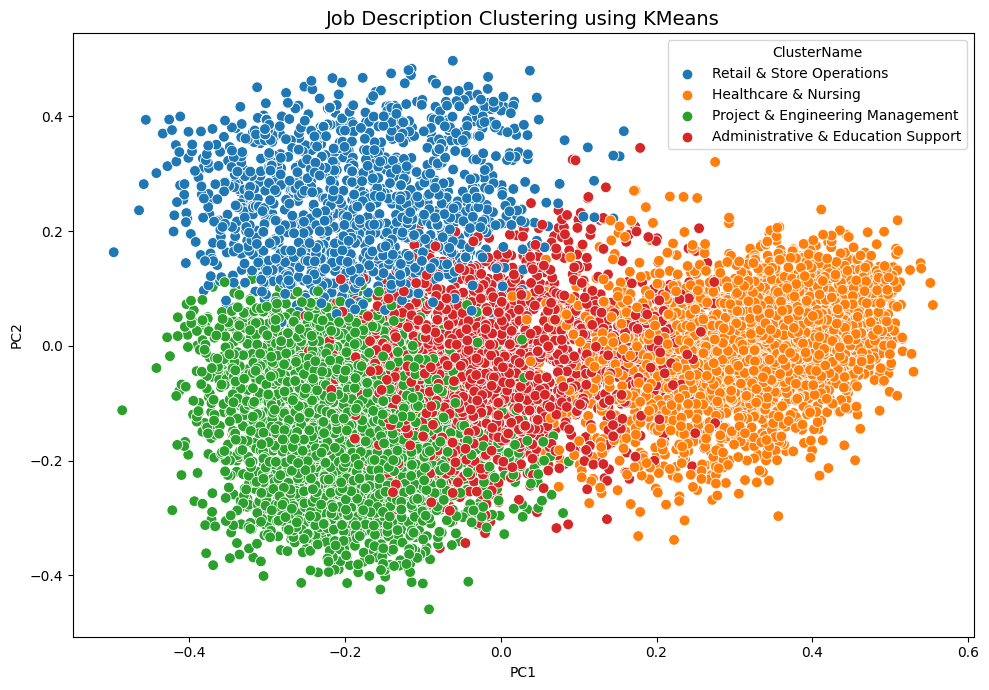

In [0]:
# Plot the clusters
df = pd.DataFrame(reduced, columns=["PC1", "PC2"])
df["Cluster"] = clusters

cluster_name_map = {
    0: "Project & Engineering Management",
    1: "Healthcare & Nursing",
    2: "Retail & Store Operations",
    3: "Administrative & Education Support",   
}

df["ClusterName"] = df["Cluster"].map(cluster_name_map)

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x="PC1", y="PC2", hue="ClusterName", palette="tab10", s=60)
plt.title("Job Description Clustering using KMeans", fontsize=14)
plt.tight_layout()
plt.show()

IOStream.flush timed out


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3614314504000366>, line 1
----> 1 df.head()

NameError: name 'df' is not defined

In [0]:
# Plot the clusters
df = pd.DataFrame(reduced, columns=["PC1", "PC2"])
df["Cluster"] = clusters



---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3614314504000365>, line 2
      1 # Plot the clusters
----> 2 df = pd.DataFrame(reduced, columns=["PC1", "PC2"])
      3 df["Cluster"] = clusters

NameError: name 'reduced' is not defined

In [0]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df, x="PC1", y="PC2", hue="Cluster", palette="tab10", s=60)
plt.title("Job Description Clustering using KMeans)", fontsize=14)
plt.legend
plt.tight_layout()
plt.show()

#### Load the Courses database

In [0]:
from pyspark.sql.functions import col, concat_ws, collect_list, size


In [0]:
dataset_path = '/FileStore/tables/job_user_matching/Online_Courses.csv'

def upload_data(file_location):
    # File location and type
    file_type = "csv"

    # CSV options
    infer_schema = "false"
    first_row_is_header = "true"
    delimiter = ","
    quote_char = '"'

    # The applied options are for CSV files. For other file types, these will be ignored.
    df = spark.read.format(file_type) \
    .option("inferSchema", infer_schema) \
    .option("header", first_row_is_header) \
    .option("sep", delimiter) \
    .option("multiline", "true") \
    .option("quote", quote_char) \
    .option("maxCharsPerColumn", 1000000) \
    .option("escape", '"') \
    .load(file_location)

    return df

courses_df = upload_data(file_location=dataset_path)

In [0]:
courses_concat_text = courses_df.withColumn(
    "course_desc", 
    concat_ws("; ", col("Title"),
                    col("Category"),
                    col("Sub-Category"),
                    col("Short Intro"),
                    col("Skills")))

courses_concat_text = courses_concat_text.select("Title",
                                                 "url",
                                                 "course_desc",
                                                 "Skills")


In [0]:
courses_df = courses_df.dropDuplicates(["url"])

Examine the distribution of number of sentences in the description of each course

In [0]:
# Add sentence count by splitting on '.'
courses_df = courses_df.withColumn("sentence_count", size(split("Short Intro", r"\.")))

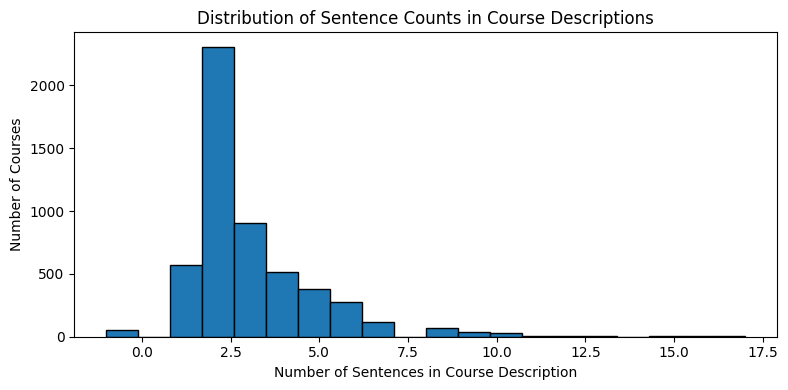

In [0]:
import matplotlib.pyplot as plt

# Convert to pandas and plot histogram
pdf = courses_df.select("sentence_count").toPandas()

plt.figure(figsize=(8, 4))
plt.hist(pdf["sentence_count"], bins=20, edgecolor='black')

plt.xlabel("Number of Sentences in Course Description")
plt.ylabel("Number of Courses")
plt.title("Distribution of Sentence Counts in Course Descriptions")

plt.tight_layout()
plt.show()

Examine which categories and sub-categories are in the dataset

In [0]:
courses_groupby_category.display()

Category,count
null,2454
Business,895
Computer Science,455
Data Science,448
Health,264
Information Technology,221
Physical Science and Engineering,150
Arts and Humanities,120
Language Learning,86
Social Sciences,83


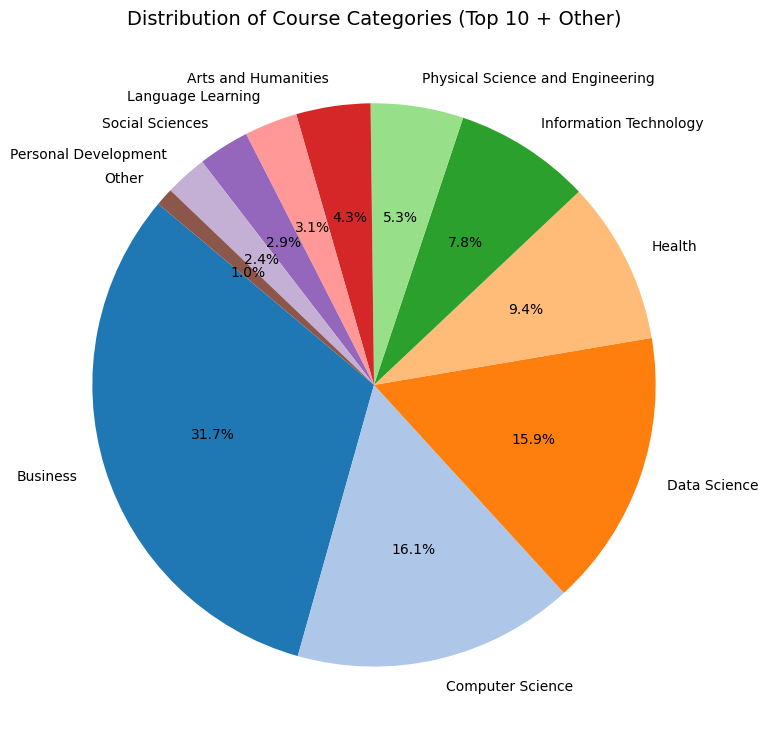

In [0]:
from pyspark.sql.functions import col

# Group by Category
courses_groupby_category = courses_df.groupBy("Category").count().orderBy("count", ascending=False)

# Filter out nulls and "nan" strings BEFORE converting to Pandas
courses_groupby_category_filtered = courses_groupby_category.filter(
    (col("Category").isNotNull()) & (col("Category") != "nan")
).toPandas()

# Sort and optionally keep only the top N categories
top_n = 10
courses_groupby_category_filtered = courses_groupby_category_filtered.sort_values("count", ascending=False)

# Group remaining into "Other"
if len(courses_groupby_category_filtered) > top_n:
    top_categories = courses_groupby_category_filtered[:top_n]
    other = pd.DataFrame([{
        "Category": "Other",
        "count": courses_groupby_category_filtered["count"][top_n:].sum()
    }])
    courses_groupby_category_filtered = pd.concat([top_categories, other], ignore_index=True)

# Pie chart
plt.figure(figsize=(8, 8))
colors = plt.cm.tab20.colors  # More distinct colors
plt.pie(
    courses_groupby_category_filtered["count"],
    labels=courses_groupby_category_filtered["Category"],
    autopct="%1.1f%%",
    startangle=140,
    textprops={'fontsize': 10},
    colors=colors
)
plt.title("Distribution of Course Categories (Top 10 + Other)", fontsize=14)
plt.tight_layout()
plt.show()

In [0]:
# Group by Sub-Category
courses_groupby_category_sub_category = courses_df.groupBy("Category","Sub-Category").count().orderBy("Category","Sub-Category","count", ascending=[True,True,False])
courses_groupby_category_sub_category.display()

Category,Sub-Category,count
null,null,2454
Arts and Humanities,History,7
Arts and Humanities,Music and Art,106
Arts and Humanities,Philosophy,7
Business,Business Essentials,211
Business,Business Strategy,116
Business,Entrepreneurship,28
Business,Finance,156
Business,Leadership and Management,256
Business,Marketing,128


Display the most frequent skills in each category and sub-category

In [0]:
from pyspark.sql.functions import col, split, explode, lower, trim, row_number
from pyspark.sql.window import Window


courses_df = courses_df.withColumn("skill_array", split(col("Skills"), ","))
exploded_df = courses_df.withColumn("skill", explode(col("skill_array")))

# Normalize skill names
exploded_df = exploded_df.withColumn("skill", lower(trim(col("skill"))))

grouped_skills_cat = exploded_df.groupBy("Category", "skill").count()

# Rank by count per Category
window_cat = Window.partitionBy("Category").orderBy(col("count").desc())
ranked_skills_cat = grouped_skills_cat.withColumn("rank", row_number().over(window_cat))

top_skills_cat = ranked_skills_cat.filter(col("rank") <= 5)

top_skills_cat.select("Category", "skill", "count").display()

Category,skill,count
null,data cleaning,9
null,cloud computing fluency,8
null,hyperparameter tuning,8
null,sql queries,7
null,model evaluation,7
Arts and Humanities,,87
Arts and Humanities,music,31
Arts and Humanities,songwriting,16
Arts and Humanities,creativity,16
Arts and Humanities,music recording,15
